# Notebook 2 Extension: c-TF-IDF Word Clouds and the Bridge to Soft Clustering

# Purpose:
This notebook picks up where Notebook 2 left off. After running UMAP + HDBSCAN + c-TF-IDF,
you have cluster assignments and c-TF-IDF keyword scores per topic. But numbers and keyword
lists are hard to scan quickly. This notebook turns those scores into **word clouds** — one
per topic — so you can visually assess whether the discovered topics are coherent.

More importantly, it uses word clouds as a **diagnostic tool**. When the same keywords appear
in multiple topic clouds, that is a signal that some documents straddle topic boundaries. This
naturally motivates the move from hard clustering (one topic per document) to **soft clustering**
(a probability distribution across topics per document).

# We will:
1. Load the cluster assignments and c-TF-IDF scores from Notebook 2 (or regenerate them)
2. Generate word clouds per topic, sized by c-TF-IDF weight
3. Identify keywords that appear across multiple topics (the overlap problem)
4. Inspect specific documents that contain overlapping keywords
5. Introduce soft clustering as the principled response to keyword overlap
6. Compare hard assignments vs. soft membership for boundary documents

# Prerequisites:
- **Option A (recommended):** Run this as a continuation of Notebook 2 in the same session.
  The variables `df`, `clusters`, `topic_keywords`, `reduced_embeddings`, and `clusterer`
  will already be in memory.
- **Option B (standalone):** If running in a fresh session, Step 1 below will reload the
  data and regenerate everything from the CSV + saved embeddings.

# Libraries used:
- wordcloud: Word cloud generation
- matplotlib/seaborn: Visualization
- hdbscan: Soft clustering via `all_points_membership_vectors`
- sklearn.feature_extraction.text: CountVectorizer for c-TF-IDF
- pandas/numpy: Data manipulation

# Install required packages (run once):
# !pip install wordcloud matplotlib seaborn hdbscan pandas numpy scikit-learn umap-learn scikit-fuzzy

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from collections import Counter, defaultdict
from sklearn.feature_extraction.text import CountVectorizer
import warnings

warnings.filterwarnings('ignore')
sns.set_style('whitegrid')
print("Libraries loaded successfully.")

Libraries loaded successfully.


---
## Step 1: Load or regenerate Notebook 2 artifacts

This cell checks whether the key variables from Notebook 2 are already in memory.
If they are (because you ran Notebook 2 in this same session), it simply reports what
it found. If they are missing, it reloads the data and reruns the full pipeline:
embeddings, UMAP, HDBSCAN, and c-TF-IDF.

**Variables from Notebook 2 that this extension needs:**
- `df` — the DataFrame with web page text (column: `full_text`)
- `clusters` — HDBSCAN cluster assignment per document (array of ints, -1 = outlier)
- `topic_keywords` — dict mapping cluster_id to list of (word, c-tfidf-score) tuples
- `reduced_embeddings` — UMAP-reduced embeddings (for soft clustering later)
- `clusterer` — the fitted HDBSCAN object (for soft membership later)

In [2]:
# =====================================================================
# compute_ctfidf: the same function from Notebook 2, included here
# so this notebook can regenerate topic keywords if needed.
# =====================================================================
def compute_ctfidf(documents, clusters, top_n=10):
    """
    Compute c-TF-IDF: class-based TF-IDF for topic representation.
    
    Parameters:
    -----------
    documents : list of str - all document texts
    clusters  : array-like  - cluster assignment per document (-1 = outlier)
    top_n     : int         - number of top keywords per topic
    
    Returns:
    --------
    dict mapping cluster_id -> list of (word, score) tuples
    """
    # Group documents by cluster (skip outliers)
    cluster_docs = {}
    for doc, cluster_id in zip(documents, clusters):
        if cluster_id == -1:
            continue
        if cluster_id not in cluster_docs:
            cluster_docs[cluster_id] = []
        cluster_docs[cluster_id].append(doc)
    
    # Concatenate documents per cluster into single "class documents"
    cluster_ids = sorted(cluster_docs.keys())
    class_documents = [' '.join(cluster_docs[cid]) for cid in cluster_ids]
    
    # Fit CountVectorizer on the class documents
    vectorizer = CountVectorizer(
        max_features=10000,
        stop_words='english',
        min_df=2,
        ngram_range=(1, 2)
    )
    tf = vectorizer.fit_transform(class_documents)
    
    # c-TF-IDF computation
    tf_dense = tf.toarray().astype(float)
    tf_normalized = tf_dense / tf_dense.sum(axis=1, keepdims=True)
    
    n_classes = len(class_documents)
    df_count = (tf_dense > 0).sum(axis=0)
    idf = np.log(1 + n_classes / (df_count + 1))
    
    ctfidf = tf_normalized * idf
    
    # Extract top keywords per cluster
    feature_names = vectorizer.get_feature_names_out()
    topic_keywords = {}
    
    for idx, cid in enumerate(cluster_ids):
        scores = ctfidf[idx]
        top_indices = scores.argsort()[-top_n:][::-1]
        keywords = [(feature_names[i], scores[i]) for i in top_indices]
        topic_keywords[cid] = keywords
    
    return topic_keywords

print("compute_ctfidf function defined.")

compute_ctfidf function defined.


In [7]:
# =====================================================================
# Check which variables from Notebook 2 are already in memory.
# If all are present, we just report and move on.
# If any are missing, we regenerate the full pipeline.
# =====================================================================

nb2_ready = all(var in dir() for var in ['df', 'clusters', 'topic_keywords'])

if nb2_ready:
    # -------------------------------------------------------------------
    # OPTION A: Variables from Notebook 2 are in memory
    # -------------------------------------------------------------------
    n_topics = len([c for c in set(clusters) if c != -1])
    n_outliers = sum(1 for c in clusters if c == -1)
    print("Notebook 2 variables found in memory.")
    print(f"  Documents:          {len(df):,}")
    print(f"  Topics discovered:  {n_topics}")
    print(f"  Outlier documents:  {n_outliers:,}")
    print(f"  Topic keywords for: {len(topic_keywords)} topics")
    
else:
    # -------------------------------------------------------------------
    # OPTION B: Fresh session — regenerate everything from scratch.
    # Adjust the file paths below to match your environment.
    # -------------------------------------------------------------------
    print("Notebook 2 variables not found. Regenerating the full pipeline...")
    print()
    
    import hdbscan
    import umap
    
    # --- 1. Load data ---
    DATA_PATH = 'english_pages_metadata_clean_with_labels.csv'  # <-- adjust if needed
    df = pd.read_csv(DATA_PATH)
    print(f"Loaded {len(df):,} documents from {DATA_PATH}")
    
    # Use the full_text column; fall back to text if full_text is missing
    text_col = 'full_text' if 'full_text' in df.columns else 'text'
    df[text_col] = df[text_col].fillna('')
    
    # --- 2. Load embeddings (saved as .npy from Notebook 1) ---
    # Try the default MiniLM embeddings first
    EMBEDDING_PATH = 'minilm_embeddings.npy'  # <-- adjust if needed
    try:
        embeddings = np.load(EMBEDDING_PATH)
        print(f"Loaded embeddings: {embeddings.shape}")
    except FileNotFoundError:
        print(f"ERROR: Could not find {EMBEDDING_PATH}")
        print("Please set EMBEDDING_PATH to the correct .npy file from Notebook 1.")
        print("Available .npy files in current directory:")
        import glob
        for f in glob.glob('*.npy'):
            print(f"  {f}")
        raise
    
    # --- 3. UMAP reduction ---
    print("Running UMAP dimensionality reduction...")
    reducer = umap.UMAP(
        n_components=5,
        n_neighbors=15,
        min_dist=0.0,
        metric='cosine',
        random_state=42
    )
    reduced_embeddings = reducer.fit_transform(embeddings)
    print(f"  Reduced: {embeddings.shape[1]}D -> {reduced_embeddings.shape[1]}D")
    
    # --- 4. HDBSCAN clustering ---
    print("Running HDBSCAN clustering...")
    clusterer = hdbscan.HDBSCAN(
        min_cluster_size=15,
        min_samples=5,
        metric='euclidean',
        prediction_data=True   # enables soft clustering later
    )
    clusters = clusterer.fit_predict(reduced_embeddings)
    
    n_topics = len([c for c in set(clusters) if c != -1])
    n_outliers = sum(1 for c in clusters if c == -1)
    print(f"  Topics discovered:  {n_topics}")
    print(f"  Outlier documents:  {n_outliers:,}")
    
    # --- 5. c-TF-IDF topic representation ---
    print("Computing c-TF-IDF topic keywords...")
    documents = df[text_col].tolist()
    topic_keywords = compute_ctfidf(documents, clusters, top_n=20)
    print(f"  Topic keywords generated for {len(topic_keywords)} topics.")
    
    print("\nPipeline regeneration complete.")

Notebook 2 variables not found. Regenerating the full pipeline...

Loaded 596 documents from english_pages_metadata_clean_with_labels.csv
Loaded embeddings: (6314, 384)
Running UMAP dimensionality reduction...
  Reduced: 384D -> 5D
Running HDBSCAN clustering...
  Topics discovered:  90
  Outlier documents:  2,326
Computing c-TF-IDF topic keywords...
  Topic keywords generated for 81 topics.

Pipeline regeneration complete.


In [8]:
# Quick sanity check: show top 5 keywords per topic
print("Topic keyword summary:")
print("=" * 60)
for topic_id in sorted(topic_keywords.keys()):
    n_docs = sum(1 for c in clusters if c == topic_id)
    kw_str = ' | '.join([w for w, s in topic_keywords[topic_id][:5]])
    print(f"  Topic {topic_id:>2} ({n_docs:>4} docs): {kw_str}")

Topic keyword summary:
  Topic  1 (  24 docs): 22 2009 | 2009 | said | march 22 | march
  Topic  3 (  16 docs): bot | wordpress | easter | tennis | wordpress org
  Topic  4 (  18 docs): android | sample | code | android android | google
  Topic  5 (  73 docs): stainless | stainless steel | steel | 000 | series
  Topic  6 (  33 docs): quotes | palace | happy | granada | day
  Topic  7 (  18 docs): 1024 | 06 28 | 768 | 28 10 | texas
  Topic  8 (  42 docs): dec 2025 | 2025 | dec | nov | 2025 https
  Topic  9 ( 209 docs): school | insurance | middle school | meet | semantic
  Topic 10 (  15 docs): fertility | specialists | shop | ebook | nuclear
  Topic 11 (  19 docs): chimney | fireplace | repair | known | jasa
  Topic 12 (  15 docs): phillips | harvard | agile | cookie | discipline
  Topic 13 (  34 docs): 03 | 09 | 08 | 07 | 06
  Topic 14 (  91 docs): teeth | vpn | tooth | partial | install
  Topic 15 (  26 docs): contact lenses | lenses | ski | geo | contacts
  Topic 16 (  90 docs): law

---
## Step 2: Generate c-TF-IDF word clouds per topic

**What are we doing?**

For each topic, we take the top keywords and their c-TF-IDF scores from the step above
and pass them to the WordCloud library using `generate_from_frequencies()`. This sizes
each word by its c-TF-IDF weight — meaning words are sized by **distinctiveness to the
topic**, not by raw frequency.

This is a critical difference from Program 1 (Yelp reviews), where word clouds used raw
counts or difference of proportions. Here, c-TF-IDF has already done the heavy lifting
of identifying which words are characteristic of each cluster.

**Layout:** We display the word clouds in a grid — one cloud per topic — so all topics
can be compared at a glance. The color scheme varies per topic to make the grid
easier to scan.

Generating word clouds for 81 topics...
Each cloud uses the top 20 keywords from c-TF-IDF.


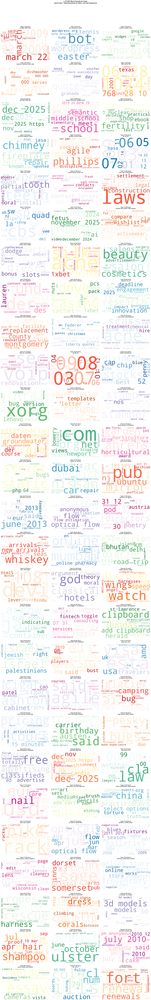

In [9]:
# -----------------------------------------------------------------------
# Color maps for different topics — one per cloud for visual distinction.
# If you have more topics than colormaps, they will cycle.
# -----------------------------------------------------------------------
COLORMAPS = ['Reds', 'Blues', 'Greens', 'Oranges', 'Purples',
             'YlOrRd', 'BuGn', 'RdPu', 'YlGn', 'GnBu',
             'OrRd', 'PuBu', 'BuPu', 'PuRd']

# Sort topic IDs (exclude -1 outlier cluster)
topic_ids = sorted([tid for tid in topic_keywords.keys() if tid != -1])
n_topics = len(topic_ids)

print(f"Generating word clouds for {n_topics} topics...")
print(f"Each cloud uses the top {len(topic_keywords[topic_ids[0]])} keywords from c-TF-IDF.")

# Determine grid layout
n_cols = min(3, n_topics)
n_rows = (n_topics + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(7 * n_cols, 5 * n_rows))

# Flatten axes for easy iteration (handles both 1-row and multi-row grids)
if n_topics == 1:
    axes_flat = [axes]
elif n_rows == 1:
    axes_flat = list(axes)
else:
    axes_flat = axes.flatten()

for idx, topic_id in enumerate(topic_ids):
    ax = axes_flat[idx]
    
    # Convert keyword list to frequency dictionary for WordCloud
    # topic_keywords[topic_id] is a list of (word, score) tuples
    keyword_scores = {word: score for word, score in topic_keywords[topic_id]}
    
    # Count documents in this topic
    n_docs = sum(1 for c in clusters if c == topic_id)
    
    # Generate word cloud sized by c-TF-IDF scores
    wc = WordCloud(
        width=800,
        height=500,
        max_words=30,
        background_color='white',
        colormap=COLORMAPS[idx % len(COLORMAPS)],
        collocations=False,
        random_state=42
    ).generate_from_frequencies(keyword_scores)
    
    ax.imshow(wc, interpolation='bilinear')
    ax.axis('off')
    
    # Title shows topic ID and document count
    top_3_words = ', '.join([w for w, s in topic_keywords[topic_id][:3]])
    ax.set_title(f'Topic {topic_id} ({n_docs:,} docs)\n{top_3_words}',
                 fontsize=12, fontweight='bold', pad=10)

# Hide any unused subplot slots
for idx in range(n_topics, len(axes_flat)):
    axes_flat[idx].axis('off')

plt.suptitle('c-TF-IDF Word Clouds by Topic\n(word size = distinctiveness to topic, not raw frequency)',
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
# plt.savefig('fig_ctfidf_wordclouds_grid.png', dpi=150, bbox_inches='tight')
plt.show()

**What to look for:**
- Does each word cloud show a coherent theme? (e.g., all political words in one cloud, all technology words in another)
- Are there any clouds that look like a grab bag of unrelated words? That may indicate a poorly formed cluster.
- **Most importantly:** do you see any words that appear in more than one cloud? Hold that thought — we will quantify this next.

---
## Step 3: Identify overlapping keywords across topics

This is the key diagnostic step. We scan through all topic keyword lists and find words
that appear in the top keywords of **more than one topic**. These "boundary words" indicate
that the topics are not perfectly separable — some documents likely belong to multiple topics.

**Why this matters:**

In Program 1 (Yelp reviews), we saw that words like "service" and "chicken" appeared in
both low-rated and high-rated word clouds. The fix there was difference of proportions.
Here, the situation is different: c-TF-IDF has *already* weighted for distinctiveness,
so if a word still appears in multiple topics, it genuinely straddles topic boundaries.
The fix is not a better weighting scheme — it is a more flexible clustering approach.

In [10]:
# -----------------------------------------------------------------------
# Build a reverse index: word -> list of (topic_id, score) tuples
# -----------------------------------------------------------------------
word_to_topics = defaultdict(list)

for topic_id in topic_ids:
    for word, score in topic_keywords[topic_id]:
        word_to_topics[word].append((topic_id, score))

# Find words that appear in 2+ topic keyword lists
overlapping_words = {word: topics for word, topics in word_to_topics.items()
                     if len(topics) >= 2}

print(f"Total unique keywords across all topics: {len(word_to_topics):,}")
print(f"Keywords appearing in 2+ topics: {len(overlapping_words)}")
if len(word_to_topics) > 0:
    print(f"Overlap rate: {len(overlapping_words)/len(word_to_topics)*100:.1f}%")
print()

if overlapping_words:
    print("Overlapping keywords and which topics share them:")
    print("-" * 70)
    print(f"{'Keyword':<20} {'Topics (with c-TF-IDF scores)':<50}")
    print("-" * 70)
    
    for word, topics in sorted(overlapping_words.items(),
                                key=lambda x: len(x[1]), reverse=True):
        topic_str = ', '.join([f'T{tid} ({score:.4f})' for tid, score in topics])
        print(f"  {word:<20} {topic_str}")
else:
    print("No overlapping keywords found - topics are cleanly separated.")
    print("(This is unusual and may indicate very distinct clusters or too few keywords per topic.)")

Total unique keywords across all topics: 1,331
Keywords appearing in 2+ topics: 203
Overlap rate: 15.3%

Overlapping keywords and which topics share them:
----------------------------------------------------------------------
Keyword              Topics (with c-TF-IDF scores)                     
----------------------------------------------------------------------
  said                 T1 (0.0243), T45 (0.0476), T59 (0.0121), T60 (0.0293), T63 (0.0414), T66 (0.0293), T85 (0.0256)
  pm                   T1 (0.0160), T60 (0.0226), T66 (0.0180), T70 (0.0274), T85 (0.0187)
  10                   T6 (0.0081), T13 (0.0165), T32 (0.0219), T56 (0.0152), T83 (0.0263)
  dec                  T8 (0.0321), T29 (0.0141), T69 (0.0174), T75 (0.0156), T83 (0.0150)
  van                  T30 (0.0132), T51 (0.0153), T71 (0.0094), T74 (0.0109), T87 (0.0212)
  2009                 T1 (0.0262), T55 (0.0109), T60 (0.0180), T76 (0.0234)
  march                T1 (0.0216), T53 (0.0078), T60 (0.0208), T84 (0

---
## Step 4: Visualize the overlap

Two visualizations to make the overlap concrete:

1. **Heatmap:** rows = overlapping keywords, columns = topics. Cell color = c-TF-IDF score.
   This shows at a glance which words bridge which topics.

2. **Overlap bar chart:** for each topic, how many of its top keywords are shared with
   at least one other topic? Topics with high overlap are the ones where hard clustering
   is most likely losing information.

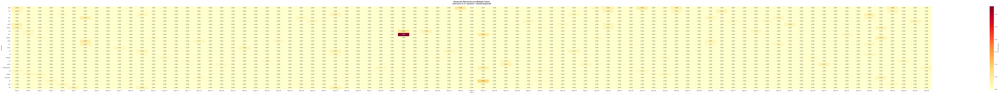

In [11]:
# -----------------------------------------------------------------------
# Visualization 1: Heatmap of overlapping keywords x topics
# -----------------------------------------------------------------------
if overlapping_words:
    overlap_list = sorted(overlapping_words.keys(),
                          key=lambda w: len(overlapping_words[w]), reverse=True)
    overlap_list = overlap_list[:25]
    
    heatmap_data = pd.DataFrame(0.0, index=overlap_list, columns=topic_ids)
    for word in overlap_list:
        for topic_id, score in word_to_topics[word]:
            if topic_id in topic_ids:
                heatmap_data.loc[word, topic_id] = score
    
    heatmap_data.columns = [f'Topic {c}' for c in heatmap_data.columns]
    
    fig, ax = plt.subplots(figsize=(max(10, n_topics * 1.5), max(8, len(overlap_list) * 0.4)))
    sns.heatmap(heatmap_data, annot=True, fmt='.3f', cmap='YlOrRd',
                linewidths=0.5, ax=ax, cbar_kws={'label': 'c-TF-IDF Score'})
    ax.set_title('Keywords Shared Across Multiple Topics\n(non-zero in 2+ columns = shared keyword)',
                 fontsize=14, fontweight='bold', pad=15)
    ax.set_ylabel('Keyword')
    ax.set_xlabel('Topic')
    plt.tight_layout()
    # plt.savefig('fig_keyword_overlap_heatmap.png', dpi=150, bbox_inches='tight')
    plt.show()
else:
    print("No overlapping keywords to plot.")

Keyword overlap per topic:
------------------------------------------------------------
  Topic  1: [#########...........]  45.0%  (9/20 keywords shared)
  Topic  3: [####................]  20.0%  (4/20 keywords shared)
  Topic  4: [#######.............]  35.0%  (7/20 keywords shared)
  Topic  5: [#...................]   5.0%  (1/20 keywords shared)
  Topic  6: [#######.............]  35.0%  (7/20 keywords shared)
  Topic  7: [####................]  20.0%  (4/20 keywords shared)
  Topic  8: [###########.........]  55.0%  (11/20 keywords shared)
  Topic  9: [###.................]  15.0%  (3/20 keywords shared)
  Topic 10: [##..................]  10.0%  (2/20 keywords shared)
  Topic 11: [##..................]  10.0%  (2/20 keywords shared)
  Topic 12: [##..................]  10.0%  (2/20 keywords shared)
  Topic 13: [###################.]  95.0%  (19/20 keywords shared)
  Topic 14: [######..............]  30.0%  (6/20 keywords shared)
  Topic 15: [####................]  20.0%  (4/20 key

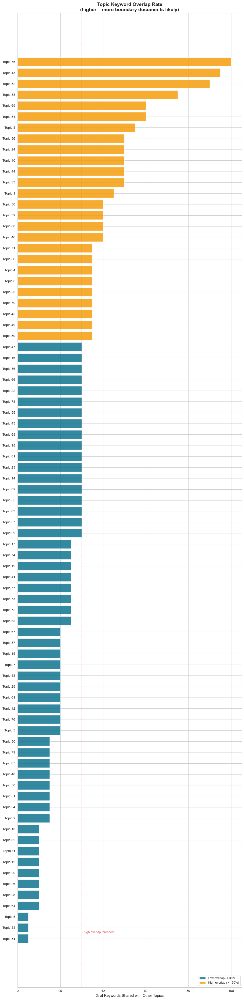

In [12]:
# -----------------------------------------------------------------------
# Visualization 2: Per-topic overlap count
# -----------------------------------------------------------------------
from matplotlib.patches import Patch

overlap_counts = {}
for topic_id in topic_ids:
    keywords_for_topic = [w for w, s in topic_keywords[topic_id]]
    shared = [w for w in keywords_for_topic if w in overlapping_words]
    total = len(keywords_for_topic)
    overlap_counts[topic_id] = {'shared': len(shared), 'unique': total - len(shared),
                                 'total': total, 'pct': len(shared) / total * 100 if total > 0 else 0}

overlap_df = pd.DataFrame(overlap_counts).T
overlap_df.index.name = 'Topic'

print("Keyword overlap per topic:")
print("-" * 60)
for tid, row in overlap_df.iterrows():
    n_blocks = int(row['pct'] / 5)
    bar = '#' * n_blocks + '.' * (20 - n_blocks)
    print(f"  Topic {tid:>2}: [{bar}] {row['pct']:5.1f}%  "
          f"({int(row['shared'])}/{int(row['total'])} keywords shared)")

# Bar chart
fig, ax = plt.subplots(figsize=(10, max(4, n_topics * 0.5)))
topics_sorted = overlap_df.sort_values('pct', ascending=True)

colors = ['#f59e0b' if pct > 30 else '#0e7490' for pct in topics_sorted['pct']]
ax.barh([f'Topic {int(t)}' for t in topics_sorted.index],
        topics_sorted['pct'], color=colors, edgecolor='white', alpha=0.85)
ax.set_xlabel('% of Keywords Shared with Other Topics', fontsize=11)
ax.set_title('Topic Keyword Overlap Rate\n(higher = more boundary documents likely)',
             fontsize=14, fontweight='bold')
ax.axvline(x=30, color='#dc2626', linestyle='--', linewidth=1, alpha=0.5)
ax.text(31, 0.5, 'high overlap threshold', color='#dc2626', fontsize=9, alpha=0.7)

legend_elements = [
    Patch(facecolor='#0e7490', alpha=0.85, label='Low overlap (< 30%)'),
    Patch(facecolor='#f59e0b', alpha=0.85, label='High overlap (>= 30%)')
]
ax.legend(handles=legend_elements, loc='lower right', fontsize=9)

plt.tight_layout()
# plt.savefig('fig_topic_overlap_rate.png', dpi=150, bbox_inches='tight')
plt.show()

---
## Step 5: Inspect boundary documents

Now that we know which keywords are shared, let's find the actual documents that contain
those keywords. These are the **boundary documents** — the ones that hard clustering had
to force into a single topic even though they straddle multiple themes.

For each overlapping keyword, we find documents assigned to different topics that contain
that keyword. These documents are the strongest candidates for multi-topic membership.

In [13]:
# -----------------------------------------------------------------------
# Find boundary documents: documents containing overlapping keywords
# -----------------------------------------------------------------------
text_col = 'full_text' if 'full_text' in df.columns else 'text'

if not overlapping_words:
    top_shared = []
    boundary_indices = []
    print("No overlapping keywords found. Skipping boundary document analysis.")
else:
    top_shared = sorted(overlapping_words.keys(),
                        key=lambda w: len(overlapping_words[w]), reverse=True)[:5]
    
    print("Boundary Document Analysis")
    print("=" * 70)
    
    for keyword in top_shared:
        topics_with_keyword = [tid for tid, score in overlapping_words[keyword]]
        print(f"\nKeyword: '{keyword}' -- shared by Topics {topics_with_keyword}")
        print("-" * 50)
        
        for tid in topics_with_keyword:
            mask = (clusters == tid)
            topic_docs = df[mask]
            contains_keyword = topic_docs[
                topic_docs[text_col].str.lower().str.contains(keyword, na=False)
            ]
            
            if len(contains_keyword) > 0:
                sample = contains_keyword.iloc[0]
                text_preview = str(sample[text_col])[:200].replace('\n', ' ')
                print(f"  Topic {tid} ({len(contains_keyword)} docs with '{keyword}'):")
                print(f"    \"{text_preview}...\"")
            else:
                print(f"  Topic {tid}: keyword in c-TF-IDF but not found in doc text (may be an n-gram)")
    
    # Save boundary indices for the first shared keyword (used in soft clustering below)
    keyword = top_shared[0]
    mask_contains = df[text_col].str.lower().str.contains(keyword, na=False)
    boundary_indices = df[mask_contains].index[:10]
    
    print("\n" + "=" * 70)
    print("\nThese documents are assigned to ONE topic by HDBSCAN, but their content")
    print("touches themes from multiple topics. This is where soft clustering helps.")

Boundary Document Analysis

Keyword: 'said' -- shared by Topics [1, 45, 59, 60, 63, 66, 85]
--------------------------------------------------


ValueError: Item wrong length 6314 instead of 596.

---
## Step 6: From hard labels to soft membership

The word cloud overlap has revealed the limitation of hard clustering: some documents
genuinely belong to more than one topic. The principled fix is **soft clustering**, where
each document gets a probability distribution across topics instead of a single label.

### Approach A: HDBSCAN soft membership
HDBSCAN can natively produce soft cluster membership by using `prediction_data=True`
during fitting, then calling `hdbscan.all_points_membership_vectors()`. This uses
the density hierarchy to compute how much each document "belongs" to each cluster.

### Approach B: Fuzzy C-Means (Step 7, optional)
An alternative that works on the same UMAP-reduced embeddings. Unlike HDBSCAN
(density-based), Fuzzy C-Means is centroid-based — it gives membership based on distance
to cluster centers. Comparing both reveals where they agree and disagree.

**Note:** If HDBSCAN was fitted without `prediction_data=True`, the cell below will
refit the clusterer with that flag enabled.

In [ ]:
# -----------------------------------------------------------------------
# Approach A: HDBSCAN soft membership
# -----------------------------------------------------------------------
import hdbscan

has_clusterer = 'clusterer' in dir()
has_reduced = 'reduced_embeddings' in dir()

soft_membership = None

if has_clusterer and hasattr(clusterer, 'prediction_data_') and clusterer.prediction_data_:
    print("HDBSCAN clusterer has prediction_data -- computing soft membership...")
    soft_membership = hdbscan.all_points_membership_vectors(clusterer)
    
elif has_reduced:
    print("HDBSCAN clusterer needs prediction_data=True. Refitting on reduced_embeddings...")
    clusterer = hdbscan.HDBSCAN(
        min_cluster_size=15,
        min_samples=5,
        metric='euclidean',
        prediction_data=True
    )
    clusterer.fit(reduced_embeddings)
    soft_membership = hdbscan.all_points_membership_vectors(clusterer)
    print("Refitting complete.")
    
else:
    print("ERROR: Neither clusterer nor reduced_embeddings found.")
    print("Soft clustering requires the UMAP-reduced embeddings from Notebook 2.")
    print("Please ensure Notebook 2 ran fully (including UMAP) before running this extension.")

if soft_membership is not None:
    print(f"\nSoft membership matrix shape: {soft_membership.shape}")
    print(f"  Rows (documents): {soft_membership.shape[0]:,}")
    print(f"  Columns (topics): {soft_membership.shape[1]}")
    print(f"  Each row sums to ~1.0: first row sums to {soft_membership[0].sum():.4f}")

In [ ]:
# -----------------------------------------------------------------------
# Show soft membership for boundary documents
# -----------------------------------------------------------------------
if soft_membership is not None and len(boundary_indices) > 0:
    keyword = top_shared[0]
    
    print(f"Soft membership for documents containing '{keyword}':")
    print("=" * 80)
    
    n_soft_topics = soft_membership.shape[1]
    n_show = min(n_soft_topics, 8)
    header = f"{'Doc Index':<12} {'Hard Label':<12} "
    header += ' '.join([f'T{i:<6}' for i in range(n_show)])
    if n_soft_topics > 8:
        header += ' ...'
    print(header)
    print("-" * 80)
    
    for doc_idx in boundary_indices:
        if doc_idx < len(soft_membership):
            hard_label = clusters[doc_idx]
            probs = soft_membership[doc_idx]
            
            max_prob = probs.max()
            prob_strs = []
            for p in probs[:n_show]:
                if p == max_prob:
                    prob_strs.append(f'{p:.3f}*')
                elif p > 0.1:
                    prob_strs.append(f'{p:.3f} ')
                else:
                    prob_strs.append(f'{p:.3f} ')
            
            row = f"  {doc_idx:<12} {'T'+str(hard_label):<12} "
            row += ' '.join([f'{s:<7}' for s in prob_strs])
            print(row)
    
    print("\n* = highest membership probability")
    print("\nDocuments with significant probability in 2+ topics are the ones")
    print("that hard clustering had to force into a single category.")
elif soft_membership is None:
    print("Soft membership not available. See error above.")
else:
    print("No boundary documents to inspect (no overlapping keywords found).")

In [ ]:
# -----------------------------------------------------------------------
# Visualization: Distribution of "multi-topic-ness" across the corpus
# -----------------------------------------------------------------------
if soft_membership is not None:
    THRESHOLD = 0.15
    
    n_significant_topics = (soft_membership > THRESHOLD).sum(axis=1)
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Left: histogram
    counts = pd.Series(n_significant_topics).value_counts().sort_index()
    colors = ['#0e7490' if x == 1 else '#f59e0b' if x == 2 else '#dc2626'
              for x in counts.index]
    axes[0].bar(counts.index, counts.values, color=colors, edgecolor='white', alpha=0.85)
    axes[0].set_xlabel('Number of Topics with Membership > 15%', fontsize=11)
    axes[0].set_ylabel('Number of Documents', fontsize=11)
    axes[0].set_title('How Many Topics Does Each Document Belong To?\n(soft membership threshold = 15%)',
                       fontsize=13, fontweight='bold')
    axes[0].set_xticks(range(0, int(n_significant_topics.max()) + 1))
    
    legend_elements = [
        Patch(facecolor='#0e7490', alpha=0.85, label='Single-topic'),
        Patch(facecolor='#f59e0b', alpha=0.85, label='Two topics'),
        Patch(facecolor='#dc2626', alpha=0.85, label='Three+ topics')
    ]
    axes[0].legend(handles=legend_elements, fontsize=9)
    
    # Right: max membership probability distribution
    max_probs = soft_membership.max(axis=1)
    axes[1].hist(max_probs, bins=30, color='#0e7490', edgecolor='white', alpha=0.85)
    axes[1].set_xlabel('Maximum Topic Membership Probability', fontsize=11)
    axes[1].set_ylabel('Number of Documents', fontsize=11)
    axes[1].set_title('Confidence of Topic Assignment\n(lower max prob = more uncertain assignment)',
                       fontsize=13, fontweight='bold')
    axes[1].axvline(x=0.5, color='#dc2626', linestyle='--', linewidth=1, alpha=0.7)
    axes[1].text(0.51, axes[1].get_ylim()[1] * 0.9, 'coin flip', color='#dc2626', fontsize=9)
    
    plt.tight_layout()
    # plt.savefig('fig_multi_topic_distribution.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    n_single = (n_significant_topics == 1).sum()
    n_multi = (n_significant_topics >= 2).sum()
    total = len(n_significant_topics)
    print(f"\nSummary:")
    print(f"  Single-topic documents: {n_single:,} ({n_single/total*100:.1f}%)")
    print(f"  Multi-topic documents:  {n_multi:,} ({n_multi/total*100:.1f}%)")
    print(f"  Avg max membership prob: {max_probs.mean():.3f}")

---
## Step 7: Fuzzy C-Means comparison (optional)

HDBSCAN soft membership is density-based: it uses the internal hierarchy to estimate
membership. Fuzzy C-Means is centroid-based: it computes membership from distance to
cluster centers. Comparing both on the same documents shows whether the multi-topic
signal is robust across methods or an artifact of one approach.

**Where they agree:** strong evidence that a document genuinely straddles topics.

**Where they disagree:** one method's geometry (density vs. centroids) fits the data
structure better in that region.

We use `skfuzzy` (scikit-fuzzy) for Fuzzy C-Means. If it is not installed, this step
will be skipped gracefully.

In [ ]:
# -----------------------------------------------------------------------
# Approach B: Fuzzy C-Means on the UMAP-reduced embeddings
# -----------------------------------------------------------------------
if 'reduced_embeddings' not in dir():
    print("reduced_embeddings not available. Skipping Fuzzy C-Means.")
else:
    try:
        import skfuzzy as fuzz
        
        n_clusters_fcm = n_topics
        data_for_fcm = reduced_embeddings.T
        
        cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
            data_for_fcm,
            c=n_clusters_fcm,
            m=2,
            error=0.005,
            maxiter=1000,
            init=None,
            seed=42
        )
        
        fcm_membership = u.T
        
        print(f"Fuzzy C-Means complete.")
        print(f"  Membership matrix shape: {fcm_membership.shape}")
        print(f"  Fuzzy Partition Coefficient (FPC): {fpc:.4f}")
        print(f"  (FPC ranges from 0 to 1; higher = crisper clusters)")
        
        if soft_membership is not None and len(boundary_indices) > 0:
            print(f"\nComparison for documents containing '{top_shared[0]}':")
            print("=" * 60)
            print(f"{'Doc':<8} {'HDBSCAN Top-2 Topics':<28} {'FCM Top-2 Topics':<28}")
            print("-" * 60)
            
            for doc_idx in boundary_indices[:8]:
                if doc_idx < len(soft_membership) and doc_idx < len(fcm_membership):
                    hdb_top2 = np.argsort(soft_membership[doc_idx])[-2:][::-1]
                    hdb_str = ', '.join([f'T{t}({soft_membership[doc_idx][t]:.2f})'
                                         for t in hdb_top2])
                    
                    fcm_top2 = np.argsort(fcm_membership[doc_idx])[-2:][::-1]
                    fcm_str = ', '.join([f'C{t}({fcm_membership[doc_idx][t]:.2f})'
                                         for t in fcm_top2])
                    
                    print(f"  {doc_idx:<8} {hdb_str:<28} {fcm_str:<28}")
            
            print("\nWhere both methods assign significant probability to 2+ topics,")
            print("the multi-topic nature of that document is well-supported.")
    
    except ImportError:
        print("scikit-fuzzy not installed. Skipping Fuzzy C-Means comparison.")
        print("To install: pip install scikit-fuzzy")
        print("\nThe HDBSCAN soft membership analysis above is sufficient on its own.")

---
## Summary

This notebook traced a path from visualization to methodology:

1. **Word clouds** made c-TF-IDF keyword scores visually scannable -- one glance per topic.

2. **Keyword overlap** revealed that some words appear in multiple topics, signaling that
   documents straddle topic boundaries.

3. **Boundary documents** showed concrete examples of web pages that genuinely belong to
   multiple topics (e.g., government technology policy touches politics *and* technology).

4. **Soft clustering** (HDBSCAN soft membership and/or Fuzzy C-Means) replaced hard
   one-topic-per-document assignment with a probability distribution across topics.

**The takeaway:** word clouds are not just a pretty visualization -- they are a diagnostic
tool. When the same keywords appear across multiple topic clouds, the correct response is
not a better weighting scheme (c-TF-IDF already handles that), but a more flexible
clustering approach that acknowledges documents can belong to more than one topic.